# 🚮 Littering Detection Training Notebook (YOLOv8 + Roboflow)

This notebook trains a YOLOv8 model to detect **people performing littering actions** (dropping, tossing, etc.).

Steps:
1. Install dependencies
2. Download dataset from Roboflow
3. (Optional) Merge all action classes into single `littering`
4. Train YOLOv8
5. Run inference
6. Save results to Google Drive or ZIP


In [ ]:
!pip install -q roboflow ultralytics opencv-python-headless pyyaml

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.7/88.7 kB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 17.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 85.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 117.6 MB/s eta 0:00:00


In [ ]:
from roboflow import Roboflow
import os

ROBofLOW_API_KEY = "P426k2kpJwIxkYX7mHm7"   # your key
WORKSPACE = "jidnesh"                        # workspace name
PROJECT = "littering-whlsk-uqd3b"            # project slug
VERSION_NUM = 1                              # dataset version

rf = Roboflow(api_key=ROBofLOW_API_KEY)
project = rf.workspace(WORKSPACE).project(PROJECT)
version = project.version(VERSION_NUM)
dataset = version.download("yolov8")

dataset_dir = getattr(dataset, "location", None) or str(dataset)
print("Dataset downloaded to:", dataset_dir)

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Littering--1 in yolov8:: 100%|██████████| 14156/14156 [00:11<00:00, 1215.98it/s]


Dataset downloaded to: /content/Littering--1


names:
- dropping
- dumping
- putting-down
- throwing
- tossing
nc: 5
roboflow:
  license: CC BY 4.0
  project: littering-whlsk-uqd3b
  url: https://universe.roboflow.com/jidnesh/littering-whlsk-uqd3b/dataset/1
  version: 1
  workspace: jidnesh
test: ../test/images
train: ../train/images
val: ../valid/images



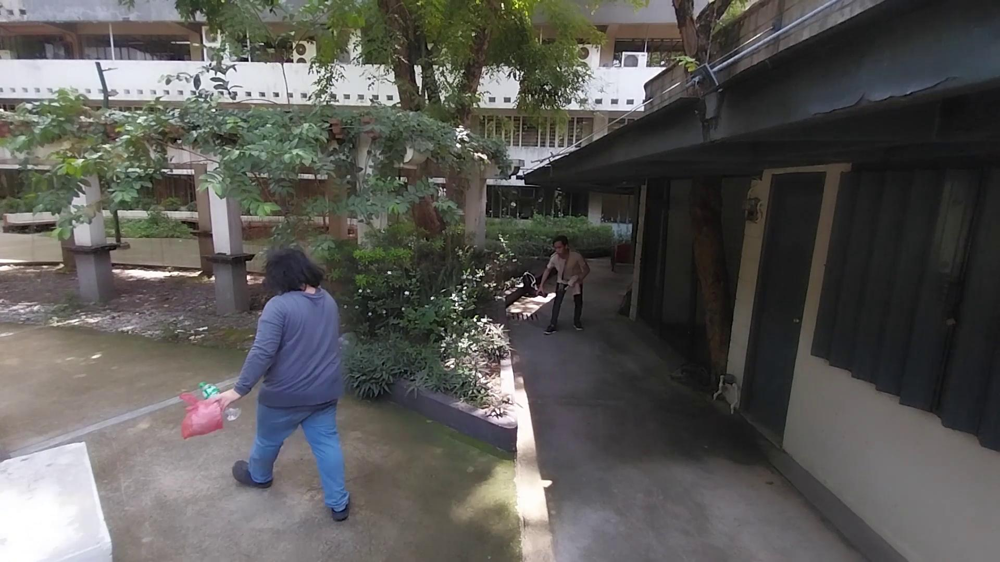

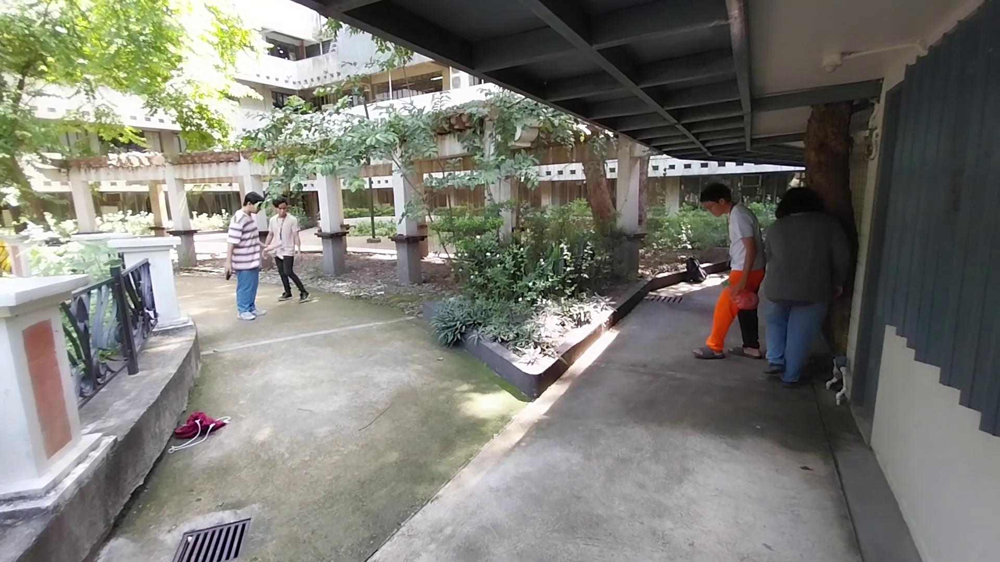

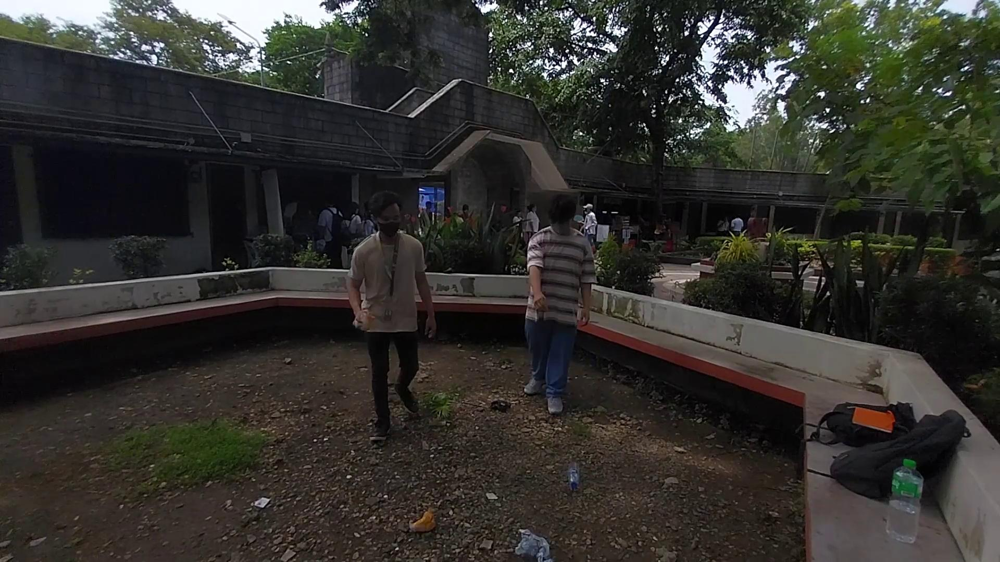

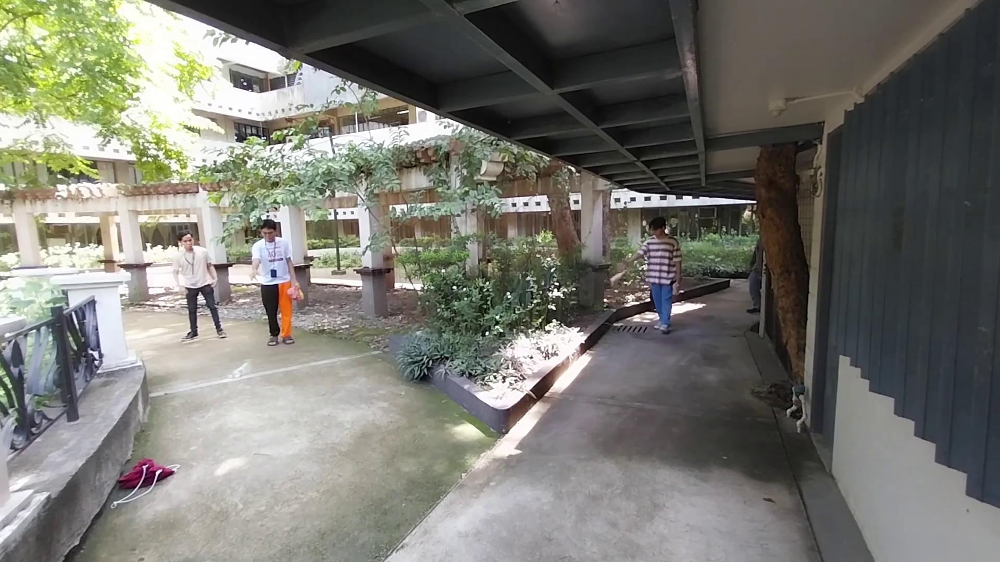

In [ ]:
import yaml, glob, PIL.Image
from IPython.display import display

data_yaml = os.path.join(dataset_dir, "data.yaml")
with open(data_yaml, "r") as f:
    print(f.read())

img_paths = glob.glob(os.path.join(dataset_dir, "train", "images", "*"))[:4]
for ip in img_paths:
    display(PIL.Image.open(ip))

In [ ]:
MERGE_TO_SINGLE_CLASS = True

if MERGE_TO_SINGLE_CLASS:
    with open(data_yaml) as f:
        data = yaml.safe_load(f)
    print("Before:", data.get("names"))

    data["nc"] = 1
    data["names"] = ["littering"]
    with open(data_yaml, "w") as f:
        yaml.dump(data, f)
    print("Updated data.yaml -> names:", data["names"])

    count = 0
    for root, dirs, files in os.walk(dataset_dir):
        for fname in files:
            if fname.endswith(".txt"):
                fpath = os.path.join(root, fname)
                with open(fpath, "r") as fr:
                    lines = fr.readlines()
                new_lines = []
                for ln in lines:
                    parts = ln.strip().split()
                    if parts:
                        parts[0] = "0"
                        new_lines.append(" ".join(parts) + "\n")
                with open(fpath, "w") as fw:
                    fw.writelines(new_lines)
                count += 1
    print(f"Rewrote {count} label files to single class '0' (littering).")
else:
    print("Keeping original classes.")

Before: ['dropping', 'dumping', 'putting-down', 'throwing', 'tossing']
Updated data.yaml -> names: ['littering']
Rewrote 7074 label files to single class '0' (littering).


In [ ]:
DATA_YAML = f"{dataset_dir}/data.yaml"
MODEL = "yolov8n.pt"   # nano model for speed
EPOCHS = 30
IMG_SIZE = 640

!yolo detect train data=$DATA_YAML model=$MODEL epochs=$EPOCHS imgsz=$IMG_SIZE

Ultralytics 8.3.196 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/Littering--1/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pos

In [ ]:
import glob
pred_imgs = glob.glob("runs/detect/train/*")
print(pred_imgs[:10])

[]


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
# -----------------------------
# 1️⃣ Mount Google Drive
# -----------------------------
from google.colab import drive
drive.mount('/content/drive')

# -----------------------------
# 2️⃣ Install YOLOv8
# -----------------------------
!pip install ultralytics --upgrade
!pip install opencv-python-headless

# -----------------------------
# 3️⃣ Import libraries
# -----------------------------
from ultralytics import YOLO
from google.colab import files
from IPython.display import Image, display

# -----------------------------
# 4️⃣ Load your model from Google Drive
# -----------------------------
model_path = "/content/drive/MyDrive/litter_model/best.pt"  # <-- change path if needed
model = YOLO(model_path)

# -----------------------------
# 5️⃣ Upload a test image
# -----------------------------
uploaded = files.upload()

# -----------------------------
# 6️⃣ Run detection and save results
# -----------------------------
for img_name in uploaded.keys():
    results = model(img_name)       # Run detection
    results.show()                  # Display results
    results.save()                  # Save annotated images in runs/detect/exp/

    # -----------------------------
    # 7️⃣ Display saved annotated image
    # -----------------------------
    output_path = "runs/detect/exp/" + img_name
    display(Image(filename=output_path))


Ultralytics 8.3.202 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1197.7±471.4 MB/s, size: 279.9 KB)
val: Scanning /content/Littering--1/valid/labels.cache... 821 images, 1 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 821/821 1.1Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 52/52 4.3it/s 12.0s


KeyError: 1

Ultralytics 8.3.202 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 4408.4±944.3 MB/s, size: 266.0 KB)
val: Scanning /content/Littering--1/valid/labels.cache... 821 images, 1 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 821/821 1.9Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 52/52 5.1it/s 10.2s
                   all        821        820      0.259      0.377      0.268      0.189
Speed: 0.1ms preprocess, 2.7ms inference, 0.0ms loss, 1.7ms postprocess per image
Precision: 0.25885630695612055
Recall: 0.3768505146565746
mAP50: 0.2684614567291552
mAP50-95: 0.18859730602903083
Accuracy: N/A (Confusion matrix sum is zero)


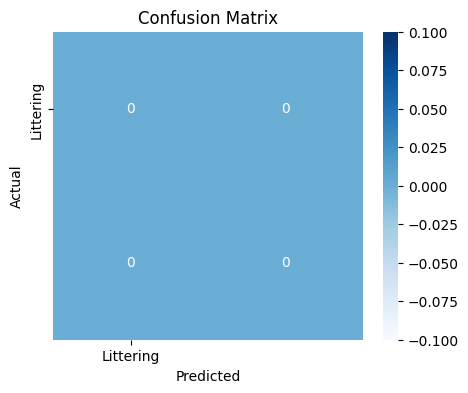

In [ ]:
from ultralytics import YOLO
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Load your trained model
model = YOLO("/content/best.pt")

# Force single-class name (This is a good step to ensure your labels are consistent)
model.model.names = {0: 'Littering'}

# Validate without plotting
metrics = model.val(data="/content/Littering--1/data.yaml", plots=False)

# Print metrics
print("Precision:", metrics.results_dict['metrics/precision(B)'])
print("Recall:", metrics.results_dict['metrics/recall(B)'])
print("mAP50:", metrics.results_dict['metrics/mAP50(B)'])
print("mAP50-95:", metrics.results_dict['metrics/mAP50-95(B)'])

# Confusion Matrix
conf_matrix = metrics.confusion_matrix.matrix.astype(int)
labels = ['Littering']

# Accuracy
total_sum = np.sum(conf_matrix)
if total_sum > 0:
    accuracy = np.trace(conf_matrix) / total_sum
    print("Accuracy:", accuracy)
else:
    print("Accuracy: N/A (Confusion matrix sum is zero)")

# Plot confusion matrix
plt.figure(figsize=(5,4))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues",
            xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()